#**Tutorial: 2DES Simulations**

> This code is a supplemental item of the Chemical Reviews article titled "Coherence in Chemistry: Foundations and Frontiers" ([doi.org/10.1021/acs.chemrev.3c00643](https://doi.org/10.1021/acs.chemrev.3c00643))

### **Overview:**

Two-dimensional electronic spectroscopy (2DES) is particularly important in studies of coherence effects in chemistry. The purpose of this tutorial is to *supplement the qualitative discussions with quantitative and physically realistic numerical simulations of 2DES spectra*.

### **Notes from the authors:**

*   **Readers with minimal coding experience**: An understanding of the code is not required for exploring the model! This is why we have the code blocks minimized by default. Please run the model at first with the preset parameters. Then, try making some changes to the parameters and observing the changes in the spectra!

*   **Readers with extensive coding experience**: Please note, these codes have been written with accessibility in mind. We have avoided many optimization opportunities for the sake of maintaining a visually appealing logic flow in the code. Please feel free make a copy of this Colab document and modify the codes to your desire!

### **Contents:**

*   **Step 1**: Choose parameters
*   **Step 2**: Generate Hamiltonian and prepare arrays
*   **Step 3**: Simulate and plot the linear response (absorption spectrum)
*   **Step 4**: Simulate the third-order response
*   **Step 5**: Apply lineshape to the third-order response
*   **Step 6**: Plot the *time-domain* 2DES spectra
*   **Step 7**: Transform the third-order signal to the frequency domain
*   **Step 8**: Plot the *frequency-domain* 2DES spectra

#### Physical assumptions made in this code:

> *For simplicity, please note that we make the following assumptions for ALL discussions that follow:*
*   *All population is in the global ground state at equilibrium*
*   *Light-matter interactions are vertical (Franck-Condon) and impulsive (pulse spectra have $\delta$-function profiles in the time domain)*
*   *System-bath interactions are phenomenological (i.e., any time evolution is strictly determined by the system Hamiltonian)*
*   *The Condon approximation holds*

In [ ]:
#@title Click to import libraries and define miscellaneous functions

import matplotlib.pyplot as plt
import numpy as np
import scipy
from math import *

%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

c_light = 2.998*10**-5    # [cm/fs]

def normalize_array_0_to_1(arr):
    normalized_arr = (arr - arr.min()) / (arr.max() - arr.min())
    return normalized_arr

def normalize2d(arr):
  arr_normalized = arr/np.max(np.abs(arr))
  return arr_normalized

def multcompreal(complex_array, real_array):
  '''
  Description: multiply complex- and real-valued arrays together by splitting up the complex array into
               real and imaginary components and multiplying each individually
  Inputs:
    complex_array : complex-valued numpy array
    real_array : real-valued numpy array

  Outputs:
    output_array : complex-valued numpy array
  '''
  realpart = np.multiply(np.real(complex_array), real_array)
  imagpart = np.multiply(np.imag(complex_array), real_array)
  output_array = realpart + 1j * imagpart
  return output_array

def view_array(ax, data, title = ''):
    ax.imshow(data, extent = [0, data.shape[1], 0, data.shape[0]], aspect = 1)
    ax.set_title(title)

def ground(vmax):           # generate vibronic basis kets for the electronic ground state
    basis = []
    for v1 in range(vmax):
        for v2 in range(vmax-v1):
          temp = np.array([0,v1,0,v2])
          basis.append(temp)
    return basis

def excited(vmax):          # generate vibronic basis kets for the electronic excited state
    basis = []
    for n in range(2):
        m = not(n)
        for v1 in range(vmax):
            for v2 in range(vmax-v1):
                temp = np.array([n,v1,m,v2])
                basis.append(temp)
    return basis

def elecre(basis,states,molnum):                # electronic creation operator
    c = np.zeros([states,states],dtype=float)
    ind = 2*(molnum-1)
    for i in range(states):
        for j in range(states):
            bra = basis[i].copy()
            ket = basis[j].copy()
            if (ket[ind] == 1):
               ket[ind] = 0
               if (ket == bra).all():
                  c[i,j] = 1
    return c

def vibcre(basis,states,molnum):                # vibrational creation operator
    b = np.zeros([states,states],dtype=float)

    for i in range(states):
        for j in range(states):
            bra = basis[i].copy()
            ket = basis[j].copy()
            ket[2*molnum-1] = ket[2*molnum-1]-1
            if (ket == bra).all():
               b[i,j] = sqrt(ket[2*molnum-1]+1)
    return b

# Define function for generating Hamiltonian

def genHam(e1, e2, J, wfreq, displacement, vmax):

  # basis kets (occupancy number basis)
  gbasis = ground(vmax)
  ebasis = excited(vmax)
  basis = gbasis + ebasis
  states = len(basis)
  fock = np.identity(states)

  # construct electronic creation operators for monomer 1 (m1) and monomer 2 (m2)
  cm1 = elecre(basis,states,1)
  cm2 = elecre(basis,states,2)

  # purely electronic Hamiltonians
  Hem1 = e1*np.matmul(cm1.transpose(),cm1)    # electronic Hamiltonian for m1
  Hem2 = e2*np.matmul(cm2.transpose(),cm2)    # electronic Hamiltonian for m2
  Hetotal = np.add(Hem1,Hem2)                 # total electronic Hamiltonian
  Hem1em2 = J*(np.matmul(cm1.transpose(),cm2)+np.matmul(cm2.transpose(),cm1))    # electronic coupling Hamiltonian (Condon approximation valid)

  # transition dipole matrix (Condon approximation)
  mu = 0.5*(cm1.transpose() + cm1 + cm2.transpose() + cm2)

  # construct vibrational creation operators for m1 and m2
  bm1 = vibcre(basis,states,1)
  bm2 = vibcre(basis,states,2)

  # purely vibrational Hamiltonians
  Hvm1 = wfreq*np.matmul(bm1.transpose(),bm1)
  Hvm2 = wfreq*np.matmul(bm2.transpose(),bm2)

  # matrix of lambda squared (just for convenience)
  lambda_sqr = np.zeros([states,states],dtype=float)
  for i in range(states):
    if (Hetotal[i,i] == 1):
      lambda_sqr[i,i] = displacement**2

  # vibronic Hamiltonians
  Hevm1 = wfreq*np.matmul(np.matmul(cm1.transpose(),cm1),displacement*(bm1.transpose()+bm1)+lambda_sqr)
  Hevm2 = wfreq*np.matmul(np.matmul(cm2.transpose(),cm2),displacement*(bm2.transpose()+bm2)+lambda_sqr)

  # combine all pieces into full Hamiltonian
  H = np.sum([Hem1, Hem2, Hem1em2, Hvm1, Hvm2, Hevm1, Hevm2], axis=0)

  # switch into rotating frame (remove a constant from the diagonal of H)
  Hrf = H.copy()
  for i in range(states):
    if Hetotal[i, i] > 0:
        Hrf[i, i] = Hrf[i, i] - e1

  w, v = np.linalg.eig(H)  # w = eigenvalues, v = eigenvectors

  return w, v, states, fock, H, Hrf, mu



---


### **Step 1: Choose parameters**

We first must set the following:


1.   **Parameters of the molecular system**: We are going to be using the Hamiltonian introduced in Figure 31 (code linked [here](https://colab.research.google.com/drive/11SqyztgYYWV9OchSYNVk0moGFjFrKm6T?usp=sharing))
2.   **Lineshape parameters**: We treat the system-bath interaction phenomenologically with a Kubo lineshape function.
3.   **Spectral parameters**: Spectroscopy generally seeks to resolve the time- and frequency-domain behavior of quantum mechanical dipoles. Therefore, we must adequately set up the parameters of our spectral simulations in order to resolve the dynamics of the molecular system. Note that several of these parameters are tunable variables in experimental set-ups.



Press the ▶️ icon on the next cell to proceed.

In [ ]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Parameters for the molecular Hamiltonian (vibronic Frenkel exciton)

e1 = 15000             # energy of molecule 1 excited electronic state [cm-1]
e2 = 15000             # energy of molecule 2 excited electronic state [cm-1]
J = 500                # value of electronic coupling (Coulombic, dipole-dipole) [cm-1]
wfreq = 1300           # vibrational frequency [cm-1]
displacement = 0.5     # dimensionless displacement along nuclear coordinate
vmax = 4               # maximum vibrational quanta considered in the Hilbert space

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Lineshape parameters

disorder_t1t3 = 1500        # [cm-1]
disorder_t2 = 200           # [cm-1]
ctime_t1t3 = 40             # [fs]
ctime_t2 = 250              # [fs]

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Spectral parameters

t1_points = 31
t3_points = 31
t2_points = 1
dt1 = 3
dt2 = 3
dt3 = 3
length_to_zero_pad = 256       # ending length of time vectors after zero padding



---


### **Step 2: Generate Hamiltonian and prepare arrays**

*Details*


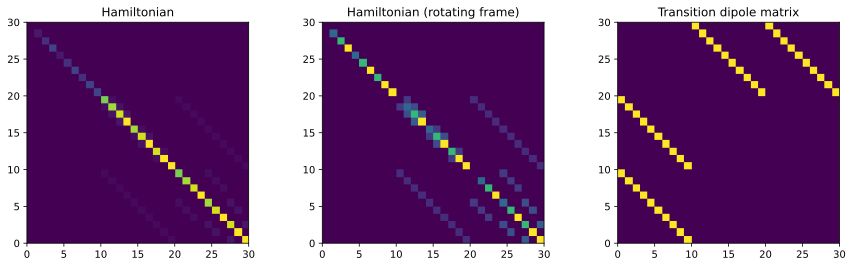

In [ ]:
#@title Click to run step 2

w, v, states, fock, H, Hrf, mu = genHam(e1, e2, J, wfreq, displacement, vmax)

data_list = [H, Hrf, mu]
title_list = ['Hamiltonian', 'Hamiltonian (rotating frame)', 'Transition dipole matrix']
fig, axes = plt.subplots(1, 3, figsize=(15, 4))  # Adjust figsize as needed
for i, ax in enumerate(axes):
    view_array(ax, data_list[i], title_list[i])
plt.show()

# convert units
disorder_t1t3 = disorder_t1t3 * c_light    # convert to [1/fs]
Hrf = (2*pi) * c_light * Hrf
mu = (2*pi) * c_light * mu

# assemble time vectors
t1_max = dt1 * t1_points
t2_max = dt2 * t2_points
t3_max = dt3 * t3_points
t1 = np.arange(0, t1_max, dt1)
t2 = np.arange(0, t2_max, dt2)
t3 = np.arange(0, t3_max, dt3)

# frequency step along w1 and w3 dimensions [cm-1]
dw1 = 1/(c_light * dt1 * length_to_zero_pad)
dw3 = 1/(c_light * dt3 * length_to_zero_pad)

#     * Sidenote: the resolution along an energy axis of the final 2DES spectrum can be
#       approximated as the frequency step (dw) obtained when the time-domain vectors
#       are zero padded to a factor of two in length (see chapter 9 of Hamm and Zanni, 2011)

# construct frequency axes (w1 and w3) [cm-1]

w3 = np.arange((-length_to_zero_pad * dw3)/2,(length_to_zero_pad * dw3)/2,dw3)
w1 = np.arange((-length_to_zero_pad * dw1)/2,(length_to_zero_pad * dw1)/2,dw1)

# shift frequency axes correct for rotating frame
w1 = w1 + e1
w3 = w3 + e1



---


### **Step 3: Simulate and plot the linear response (absorption spectrum)**

It is instructive to first calculate and understand the absorption (linear response) spectrum before proceeding to the 2DES (non-linear response) signal. Importantly, assuming the same excitation spectrum and molecular system, steady-state absorption and 2DES spectra share a common frequency axis (the x-axis in the case of Figure 49). On the surface, this is perhaps unsurprising as the linear response is intrisically one component of the non-linear response. However, it is important to recognize the following link:


> **Both absorption and 2D electronic spectroscopy resolve the energy spectrum of the quantum coherences produced by one light-matter interaction**.


At equilibrium our system is positioned in the $| 0 \rangle$ state.
For both absorption spectroscopy and 2DES (specifically the non-rephasing signal pathway, see Figure 49),

the first the interaction of an equilibrium density matrix ($| 0 \rangle \langle 0 |$) and a single electromagnetic field launches a *single quantum coherence* ($| 1 \rangle \langle 0 |$) between the electronic ground ($| 0 \rangle$) and lowest-energy excited ($| 1 \rangle$) states. The single quantum coherence evolves over the time domain we denote as $t_1$, which can be seen in the left subplot generated by the step 3 code below.

In the case of the linear response, the SQC after time $t_1$ *spontaneously* emits the signal photon, which brings the system back to the $| 0 \rangle \langle 0 |$ state. The time-domain evolution of the SQC therefore contains the information that is encoded within the more familiar frequency-domain absorption spectrum (see below).

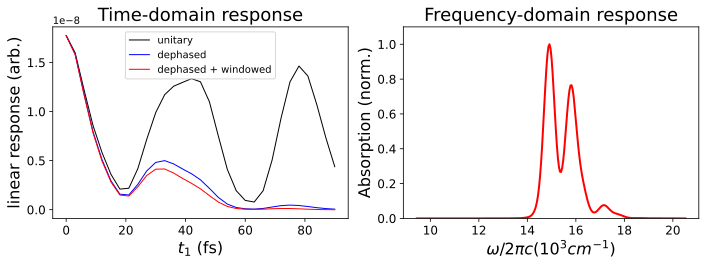

In [ ]:
#@title Click to run step 3

# linear response (assuming that all population starts in the global ground state)
Rt1 = []
ket = fock[:,0]
bra = ket.transpose()

# time propagators for numerical integration of the Schrodinger equation
def U(Hrf, t):
    return scipy.linalg.expm(-1j * Hrf * t)
def Uconj(Hrf, t):
    return scipy.linalg.expm(1j * Hrf * t)

for i in range(t1_points):
  instantaneous_value_molecular_response = bra @ mu @ U(Hrf, t1[i]) @ mu @ ket
  Rt1.append(instantaneous_value_molecular_response)

# apply phenomenological dephasing
lineshape_t1t3_1D = np.exp(-(disorder_t1t3**2)*(ctime_t1t3**2)*(np.exp(-t1/ctime_t1t3)+(t1/ctime_t1t3)-1))
Rt1_deph = np.multiply(Rt1.copy(), lineshape_t1t3_1D)

# window signal (in case the signal does not dephase fast enough to zero)
window_function = np.hanning(2 * t1_points) ** 0.5                    # create the symmetric Hann window
window_half = np.flipud(window_function[:len(window_function)//2])    # cut the Hann window in half to match FID form
Rt1_windowed = Rt1_deph.copy() * window_half

# Fourier transform response
Rw1 = np.real(np.fft.fftshift(np.fft.fft(np.pad(Rt1_windowed, (0, int(length_to_zero_pad - t1_points)), 'constant'))))
#     *Note: Other references (e.g., Hamm and Zanni, 2011) will correctly say that the absorption response is
#            the imaginary portion of the response. In our code, we take the real portion simply
#            because of how we defined our functions. If you switch to the use of 'np.imag', you will
#            observe the dispersive lineshape.

# normalize response from 0 to 1
Rw1_norm = normalize_array_0_to_1(Rw1)
w1_linear_res = (np.flipud(w1 - e1) + e1) / 1000

fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # Adjust figsize as needed

axes[0].plot(t1, np.real(Rt1), linewidth = 1, color = 'k',label = 'unitary')
axes[0].plot(t1, np.real(Rt1_deph), linewidth = 1, color = 'b',label = 'dephased')
axes[0].plot(t1, np.real(Rt1_windowed), linewidth = 1, color = 'r', label = 'dephased + windowed')
axes[0].set_title('Time-domain response', fontsize=18)
axes[0].set_xlabel("$t_1$ (fs)", fontsize=16)
axes[0].set_ylabel("linear response (arb.)", fontsize=16)
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].legend()

axes[1].plot(w1_linear_res, Rw1_norm, linewidth = 2, color = 'r')
axes[1].set_title('Frequency-domain response', fontsize=18)
axes[1].set_xlabel("$\omega /2 \pi c (10^{3} cm^{-1})$", fontsize=16)
axes[1].set_ylabel("Absorption (norm.)", fontsize=16)
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].set_ylim([0, 1.1])

plt.tight_layout()
plt.show()




---


### **Step 4: Simulate the third-order response**

The total 2DES signal is derived from numerous distinct *Liouville pathways*, which arise from different time-orderings of the light-matter interactions (see eqs. X and Y in the main text).

\

For simplicity, we consider the following response functions for this tutorial:

Abbreviation | Phase classification | Type of pathway
-|-|-
R1 | non-rephasing |ground state bleach
R2 | rephasing |stimulated emission
R3 | rephasing |ground state bleach
R4 | non-rephasing |stimulated emission

\

*Note: This part of the simulation is the most time-consuming (it only takes several seconds with the default parameters, but the scaling is very bad with increasing size of the Hamiltonian). Though many edits could be made to speed up this part of the calculation up (such as replacing loops with tensor multiplication, breaking up the Hamiltonian into smaller blocks), we think the looped approach here is perhaps the most visually insightful (less abstract).*


In [ ]:
#@title Click to run step 4

Rt1t3 = {}
for n in range(4):
  Rt1t3[str(n+1)] = np.zeros([t1_points, t3_points, t2_points], dtype = 'complex_')

for k in range(t2_points):
    for j in range(t1_points):        # column index is coherence time
        for i in range(t3_points):    # row index is rephasing time

            Rt1t3['1'][i,j,k] = bra @ mu.transpose() @ U(Hrf, t3[i]) @ mu @ U(Hrf, t2[k]) @ mu.transpose() @ U(Hrf, t1[j]) @ mu @ ket

            Rt1t3['2'][i,j,k] = bra @ mu.transpose() @ Uconj(Hrf, t1[j]) @ Uconj(Hrf, t2[k]) @ mu @ Uconj(Hrf, t3[i]) @ mu.transpose() @ U(Hrf, t3[i]) @ U(Hrf, t2[k]) @ mu @ ket

            Rt1t3['3'][i,j,k] = bra @ mu.transpose() @ Uconj(Hrf, t1[j]) @ mu @ Uconj(Hrf, t2[k]) @ Uconj(Hrf, t3[i]) @ mu.transpose() @ U(Hrf, t3[i]) @ mu @ ket

            Rt1t3['4'][i,j,k] = bra @ mu.transpose() @ Uconj(Hrf, t2[k]) @ mu @ Uconj(Hrf, t3[i]) @ mu.transpose() @ U(Hrf, t3[i]) @ U(Hrf, t2[k]) @ U(Hrf, t1[j]) @ mu @ ket




---


### **Step 5: Apply lineshape to the third-order response**

*details*


In [ ]:
#@title Click to run step 5

# Normalize signals to the maximum absolute value among all response functions (assuming this occurs at t2 = 0)
stacked_arrays = np.dstack((np.abs(Rt1t3['1'][:,:,0]), np.abs(Rt1t3['2'][:,:,0]), np.abs(Rt1t3['3'][:,:,0]), np.abs(Rt1t3['4'][:,:,0])))
max_of_stack = np.max(stacked_arrays.max(2))
Rt1t3_norm = {}
for n in range(4):
    Rt1t3_norm[str(n+1)] = multcompreal(Rt1t3[str(n+1)].copy(), 1/max_of_stack)

# Generate arrays for phenomenological lineshapes
t1mesh = np.meshgrid(t1,t1, indexing='ij')
t3mesh = np.meshgrid(t3,t3, indexing='ij')
lineshape_t1t3_2D = np.exp(-(disorder_t1t3**2)*(ctime_t1t3**2)*(np.exp(-((t1mesh[1]+t3mesh[0])/ctime_t1t3))+((t1mesh[1]+t3mesh[0])/ctime_t1t3-1)))
lineshape_t1t3_3D = np.dstack([lineshape_t1t3_2D] * t2_points)
lineshape_t2_1D = np.exp(-(disorder_t2**2)*(ctime_t2**2)*(np.exp(-(t2)/ctime_t2)+((t2)/ctime_t2)-1))
temp = np.ones([t3_points, t1_points, t2_points], dtype=float)
lineshape_t2_3D = np.multiply(temp,lineshape_t2_1D)
total_2DES_lineshape = np.multiply(lineshape_t1t3_3D.copy(), lineshape_t2_3D.copy())

# Apply phenomenological lineshapes
Rt1t3_deph = {}
for n in range(4):
  Rt1t3_deph[str(n+1)] = multcompreal(-Rt1t3_norm[str(n+1)].copy(), total_2DES_lineshape.copy())
del Rt1t3_norm

# Generate window function
window_sym = np.hanning(2 * t1_points)**0.5                         # create the symmetric Hann window
window_half = np.flipud(window_sym[:len(window_sym)//2])    # cut the Hann Window in half to match FID form
window_matrix = np.outer(window_half, window_half)
window3D = np.dstack([window_matrix] * t2_points)

# Apply window
Rt1t3_windowed = {}
for n in range(4):
    Rt1t3_windowed[str(n+1)] = multcompreal(Rt1t3_deph[str(n+1)].copy(), window3D.copy())    # Apply window function along t1 and t3
del Rt1t3_deph

# Apply the trapezoidal rule correction (see chapter 9 of Hamm and Zanni, 2011)
Rt1t3_corrected = {}
for n in range(4):
  Rt1t3_corrected[str(n+1)] = Rt1t3_windowed[str(n+1)].copy()
  Rt1t3_corrected[str(n+1)][:, 0, :] = Rt1t3_corrected[str(n+1)][:, 0, :]/2
  Rt1t3_corrected[str(n+1)][0, 1:, :] = Rt1t3_corrected[str(n+1)][0, 1:, :]/2



---


### **Step 6: Plot the *time-domain* 2DES spectra**

*details*


Text(0.5, 1, 'Example traces from R2 and R4')

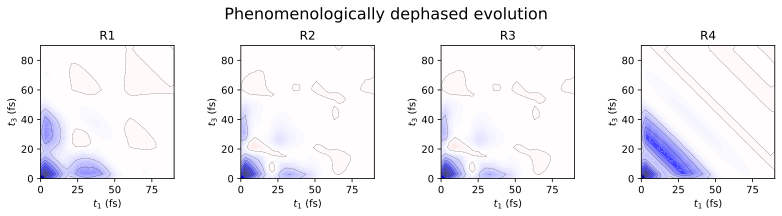

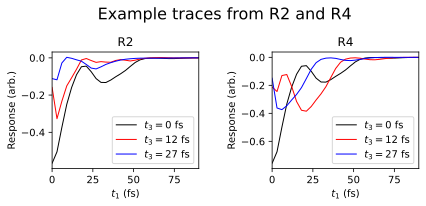

In [ ]:
#@title Click to run step 6

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

fig, axes=plt.subplots(ncols=4,nrows=1,figsize=(12, 4.5),
                        gridspec_kw={'wspace': 0.5,
                                    'hspace': 0.5,
                                    'left': 0.1,
                                    'right': 0.95,
                                    'bottom': 0.1,
                                    'top': 0.95})
ax1, ax2, ax3, ax4 = axes.flatten()

for i, ax in enumerate(axes.flat):
  temp = normalize2d(np.real(-Rt1t3[str(i+1)][:,:,0].copy()))
  ax.contour(t1, t3, temp, levels = np.arange(-1, 1, step = 0.1), colors = 'k', linestyles = 'dashed', linewidths = 0.25)
  ax.contourf(t1, t3, temp, np.arange(-1, 1, step = 0.01), cmap = 'seismic')
  ax.set_ylabel('$t_3$ (fs)')
  ax.set_xlabel('$t_1$ (fs)')
  ax.set_title(f"R{i+1}")
  ax.set_aspect('equal',adjustable='box')
  ax.set_xlim([t1.min(), t1.max()])
  ax.set_ylim([t3.min(), t3.max()])

plt.suptitle('Fully unitary evolution', fontsize=16, y=0.85)

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

fig, axes=plt.subplots(ncols=4,nrows=1,figsize=(12, 4.5),
                        gridspec_kw={'wspace': 0.5,
                                    'hspace': 0.5,
                                    'left': 0.1,
                                    'right': 0.95,
                                    'bottom': 0.1,
                                    'top': 0.95})
ax1, ax2, ax3, ax4 = axes.flatten()

for i, ax in enumerate(axes.flat):
  temp = normalize2d(np.real(Rt1t3_corrected[str(i+1)][:,:,0].copy()))
  ax.contour(t1, t3, temp, levels = np.arange(-1, 1, step = 0.1), colors = 'k', linestyles = 'dashed', linewidths = 0.25)
  ax.contourf(t1, t3, temp, np.arange(-1, 1, step = 0.01), cmap = 'seismic')
  ax.set_ylabel('$t_3$ (fs)')
  ax.set_xlabel('$t_1$ (fs)')
  ax.set_title(f"R{i+1}")
  ax.set_aspect('equal',adjustable='box')
  ax.set_xlim([t1.min(), t1.max()])
  ax.set_ylim([t3.min(), t3.max()])

plt.suptitle('Phenomenologically dephased evolution', fontsize=16, y=0.85)

# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

fig, axes=plt.subplots(ncols=2,nrows=1,figsize=(6, 2.5),
                        gridspec_kw={'wspace': 0.5,
                                    'left': 0.1,
                                    'right': 0.95,
                                    'bottom': 0.1,
                                    'top': 0.75})
ax1, ax2 = axes.flatten()

for i, ax in enumerate(axes.flat):
  res = str(2*(i+1))
  temp = normalize2d(np.real(Rt1t3_corrected[res][:,:,0].copy()))
  ax.set_title(f"R{res}")

  ax.plot(t1, temp[0,:], linewidth = 1, color = 'k',label = f'$t_3 = {t3[0]}$ fs')
  ax.plot(t1, temp[4,:], linewidth = 1, color = 'r',label = f'$t_3 = {t3[4]}$ fs')
  ax.plot(t1, temp[9,:], linewidth = 1, color = 'b',label = f'$t_3 = {t3[9]}$ fs')
  ax.set_ylabel('Response (arb.)')
  ax.set_xlabel('$t_1$ (fs)')
  ax.set_xlim([t1.min(), t1.max()])
  ax.legend()

plt.suptitle('Example traces from R2 and R4', fontsize=16, y = 1)



---


### **Step 7: Transform the third-order signals to the frequency domain**

*details*


In [ ]:
#@title Click to run step 7

Rw1w3 = {}
for n in range(4):
    Rw1w3[str(n+1)] = np.zeros([length_to_zero_pad, length_to_zero_pad, t2_points], dtype=complex)

for k in range(t2_points):
    for n in range(4):
        temp = np.fft.fft2(np.pad(Rt1t3_corrected[str(n+1)][:,:,k].copy(), (0, length_to_zero_pad - t3_points), 'constant'))
        if n+1 == 1 or n+1 == 4:
            Rw1w3[str(n+1)][:,:,k] = np.fft.fftshift(np.rot90(temp, 2))

        elif n+1 == 2 or n+1 == 3:
            temp2 = np.fliplr(np.roll(temp.copy(), -1, axis = 1))
            Rw1w3[str(n+1)][:,:,k] = np.fft.fftshift(np.rot90(temp2, 2))

Rw1w3['Rephasing'] = np.real(np.sum([Rw1w3['2'], Rw1w3['3']], axis = 0))
Rw1w3['NonRephasing'] = np.real(np.sum([Rw1w3['1'], Rw1w3['4']], axis = 0))
Rw1w3['Absorptive'] = np.real(np.sum([Rw1w3['1'], Rw1w3['2'], Rw1w3['3'], Rw1w3['4']], axis = 0))



---


### **Step 8: Plot the *frequency-domain* 2DES spectra**

*details*


In [ ]:
# select a t2 index

t2_index = 0

In [ ]:
#@title Click to run step 8

ystr = "$\omega_{3} /2 \pi c (10^{3} cm^{-1})$"
xstr = "$\omega_{1} /2 \pi c (10^{3} cm^{-1})$"

left_margin = 0.1
right_margin = 0.95
bottom_margin = 0.1
top_margin = 0.95
subplot_width_padding = 0.2
subplot_height_padding = 0.5

plotname = f'R1-R4_{round(t2[t2_index])}_fs.png'
fig, axes=plt.subplots(ncols=4,nrows=1,figsize=(16, 5),
                        gridspec_kw={'wspace': subplot_width_padding,
                                    'hspace': subplot_height_padding,
                                    'left': left_margin,
                                    'right': right_margin,
                                    'bottom': bottom_margin,
                                    'top': top_margin})
ax1, ax2, ax3, ax4 = axes.flatten()

for i, ax in enumerate(axes.flat):
    ax.contour(w1/1000, w3/1000, normalize2d(np.real(Rw1w3[str(i+1)][:,:,t2_index])), levels = np.arange(-1, 1, step = 0.1), colors = 'k', linestyles = 'dashed', linewidths = 0.25)
    ax.contourf(w1/1000, w3/1000, normalize2d(np.real(Rw1w3[str(i+1)][:,:,t2_index])), np.arange(-1, 1, step = 0.01), cmap = 'seismic')
    ax.set_ylabel(ystr)
    ax.set_xlabel(xstr)
    ax.set_title(f"R{i+1}")
    ax.set_aspect('equal',adjustable='box')
    ax.set_xlim([w1.min()/1000, w1.max()/1000])
    ax.set_ylim([w3.min()/1000, w3.max()/1000])

signals_to_plot = ['Rephasing','NonRephasing' , 'Absorptive']
plotname = f'Rtotal_{round(t2[t2_index])}_fs.png'
fig, axes=plt.subplots(ncols = len(signals_to_plot), nrows = 1, figsize=(12, 5))

for i, ax in enumerate(axes.flat):
    ax.contour(w1/1000, w3/1000, normalize2d(Rw1w3[signals_to_plot[i]][:,:, t2_index]), levels = np.arange(-1,1, step = 0.1), colors = 'k', linestyles = 'dashed', linewidths = 0.25)
    ax.contourf(w1/1000, w3/1000, normalize2d(Rw1w3[signals_to_plot[i]][:,:, t2_index]), np.arange(-1, 1, step = 0.01), cmap = 'seismic')
    ax.set_ylabel(ystr)
    ax.set_xlabel(xstr)
    ax.set_title(signals_to_plot[i])
    ax.set_aspect('equal',adjustable='box')
    ax.set_xlim([w1.min()/1000, w1.max()/1000])
    ax.set_ylim([w1.min()/1000, w1.max()/1000])